https://photutils.readthedocs.io/en/stable/aperture.html

In [1]:
pip install photutils

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 1.1 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
from photutils.aperture import CircularAperture
from photutils.aperture import aperture_photometry
from photutils.aperture import ApertureStats, CircularAperture, CircularAnnulus
from photutils.detection import DAOStarFinder
from photutils.detection import find_peaks
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import Table
from plotting import show_image

In [5]:
path= os.path.join('/home/finn/visual_Studio_Code/data/2023-10-01/stacked/')
prefix = 'lightCor_HIP100587_long_short_H-alpha_0.6s__5_images_stacked_'
prefix2 = "lightCor_HIP100587_long_short_H-alpha_30.0s__5_images_stacked_"

image_list_short=[]
short_files = [file for file in os.listdir(path) if file.startswith(prefix) and (file.endswith('.fit') or file.endswith('.fits'))]
for file in short_files:
  fits_path = os.path.join(path, file)
  hdul = fits.open(fits_path)
  image= hdul[0].data
  image_list_short.append(image)
  exptime1 = hdul[0].header["EXPTIME"]
  hdul.close()

image_list_long= []
long_files = [file for file in os.listdir(path) if file.startswith(prefix2) and (file.endswith('.fit') or file.endswith('.fits'))]
for file in long_files:
  fits_path = os.path.join(path, file)
  hdul = fits.open(fits_path)
  image= hdul[0].data
  image_list_long.append(image)
  exptime2 = hdul[0].header["EXPTIME"]
  hdul.close()

# 1. Use short image for bright star:

In [21]:
# function to determine individual radii
def determine_fwhm(data, positions,max_value=20):
    valid_positions = []
    fwhm = []
    x_values = [int(value[0]) for value in positions]
    y_values = [int(value[1]) for value in positions]
    for i in range(len(positions)):
        size = 50 # pick size larger than star area
        if x_values[i] < size or x_values[i] >= data.shape[1] - size: #if its to close to border
            row_values = data[y_values[i], x_values[i] - x_values[i]: x_values[i] + x_values[i]]
        else:
            row_values = data[y_values[i], x_values[i] - size: x_values[i] + size]
        x_coordinates = range(len(row_values))
        row_values_bkg = row_values + np.median(row_values)  # add median as background
        half_max = (np.max(row_values_bkg) / 2)
        above_half_max_indices = np.where(row_values > half_max)[0]
        lower_index = above_half_max_indices[0]
        upper_index = above_half_max_indices[-1]
        x_lower = x_coordinates[lower_index]
        x_upper = x_coordinates[upper_index]
        #plt.plot(x_coordinates, row_values_bkg)
        #plt.scatter([x_lower, x_upper], [half_max, half_max])
        calculated_fwhm = x_upper - x_lower
        if calculated_fwhm <= max_value:
            fwhm.append(calculated_fwhm)
            valid_positions.append(positions[i])
    return valid_positions, fwhm



def filter_sources(positions, sources, min_separation=50.0, min_edge_distance=50.0):
    distances = cdist(positions, positions)
    edge_distance_x = np.minimum(positions[:, 0], 2048 - positions[:, 0])
    edge_distance_y = np.minimum(positions[:, 1], 2048 - positions[:, 1])
    keep_sources = np.ones(len(positions), dtype=bool)
    for i in range(len(positions)):
        if keep_sources[i]:
            for j in range(i + 1, len(positions)):
                if distances[i, j] < min_separation:
                    flux_i = sources['flux'][i]
                    flux_j = sources['flux'][j]
                    dist_ij = distances[i, j]
                    # Keep the brighter source if it's within the minimum separation
                    if flux_j > flux_i and dist_ij < min_separation:
                        keep_sources[i] = False
                    elif flux_i > flux_j and dist_ij < min_separation:
                        keep_sources[j] = False
            if edge_distance_x[i] < min_edge_distance or edge_distance_y[i] < min_edge_distance:
                keep_sources[i] = False

    filtered_positions = positions[keep_sources]
    filtered_sources = sources[keep_sources]
    return filtered_positions, filtered_sources

[2]
[2]
[2]
[3]
[2]


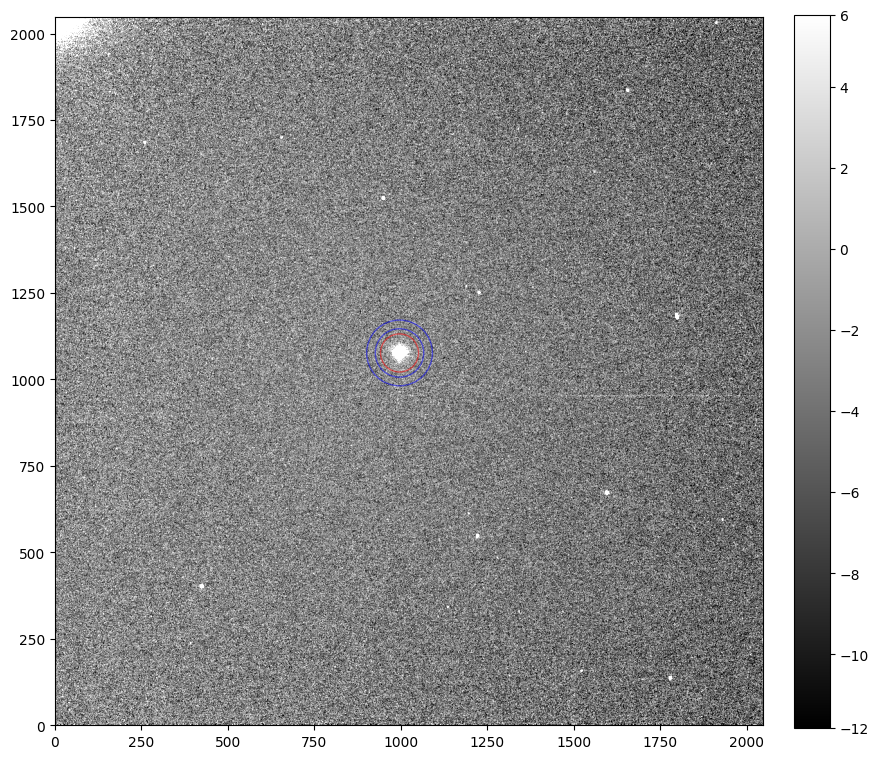

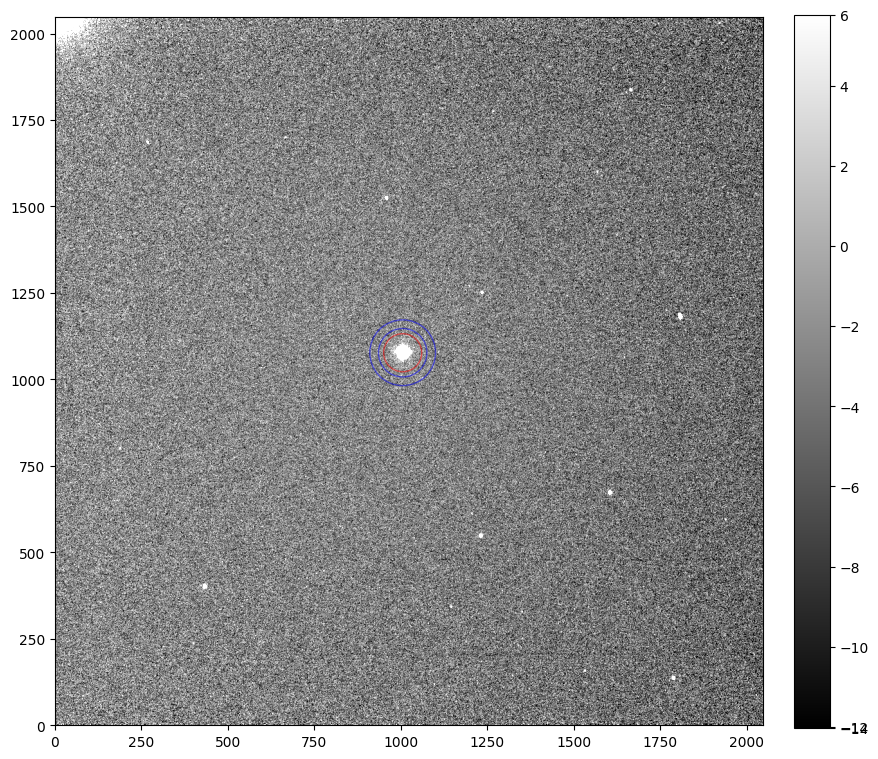

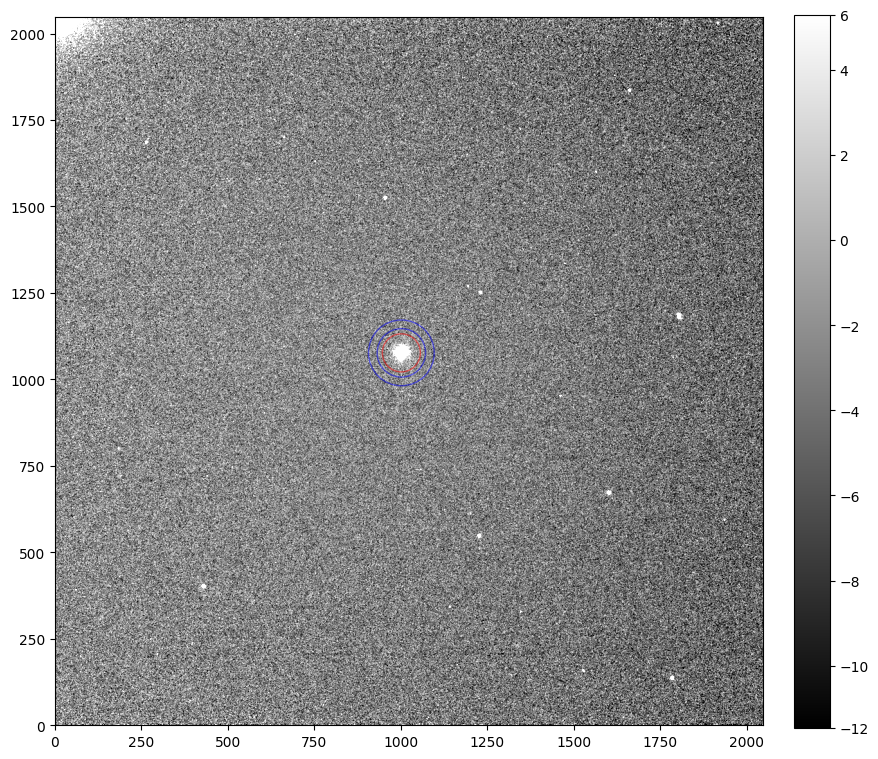

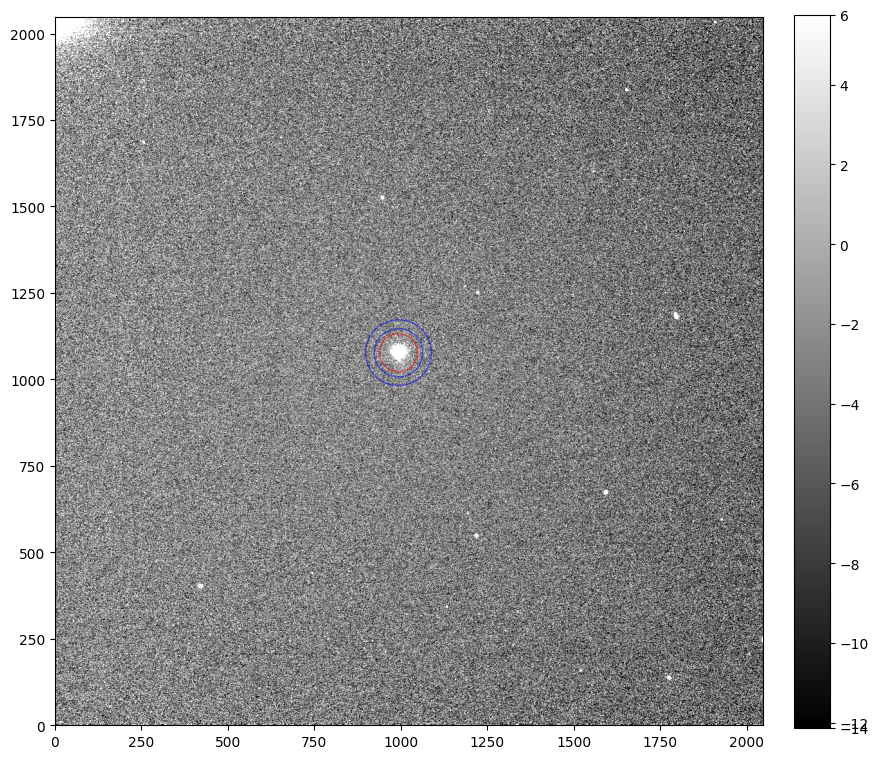

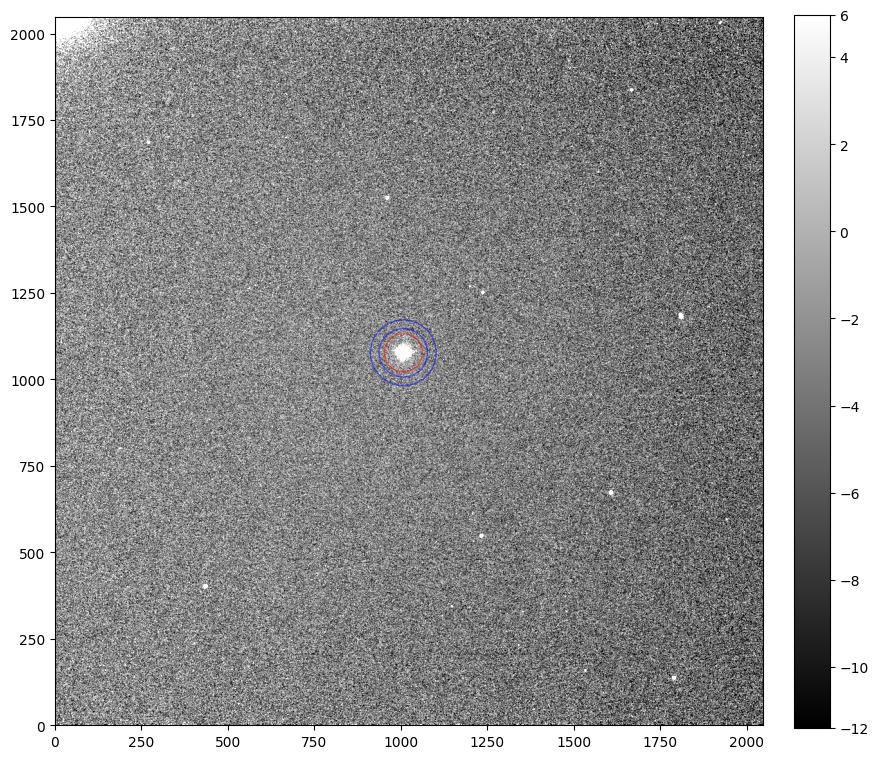

In [28]:
mask = np.zeros(image.shape, dtype=bool)
mask[1900:2048, 0:200] = True

magnitude_list_bright = []
wanted_index = np.linspace(0,len(image_list_short)-1,len(image_list_short)) #### change here to e.g. [3] if specific image wanted
# wanted_index =[3]

for index, image in enumerate(image_list_short):
  if index in wanted_index:
    mean, median, std = sigma_clipped_stats(image, sigma=3.0)
    #print((mean, median, std))
    daofind = DAOStarFinder(fwhm=5.0, threshold=5.0*std, roundlo=-1.0, roundhi=1.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
    sources = daofind(image, mask=mask)
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))

    # old version to exclude faint stars
    #positions,sources = filter_sources(positions, sources)
    #brightest_source_index = np.argmax(sources['flux'])
    #brightest_source = sources[brightest_source_index]
    #position_bright = np.transpose((brightest_source['xcentroid'], brightest_source['ycentroid']))
    valid_positions, fwhm = determine_fwhm(image, positions,50)
    print(fwhm)
    radius_bright = 55
    aperture_bright = CircularAperture(positions, r=radius_bright)
    annulus_aperture_bright = CircularAnnulus(positions, r_in=radius_bright+15, r_out=radius_bright+40)

    show_image(image)
    aperture_bright.plot(color='red', lw=1.0, alpha=0.5);
    annulus_aperture_bright.plot(color="blue", lw=1.0, alpha=0.5);

    phot_table_bright = aperture_photometry(image, aperture_bright, method='subpixel', subpixels=5)
    aperstats = ApertureStats(image, annulus_aperture_bright)
    bkg_mean = aperstats.mean #mean or median ????????????????????????????????????????
    aperture_area = aperture_bright.area_overlap(image)
    total_bkg = bkg_mean * aperture_area
    phot_table_bright['total_bkg'] = total_bkg

    for line in phot_table_bright:
      magnitude_bright = - (2.5*np.log10(abs(line[3]-line[4])/exptime1)) #M = zeropoint - 2.5*log10((flux-background)/exptime)
    #phot_table_bright['magnitude'] = magnitude_bright
    #phot_table_bright.pprint(max_lines = -1, max_width = -1)
    magnitude_list_bright.append(magnitude_bright)

In [17]:
kept_indices = []

for i, x in enumerate(magnitude_list_bright):
    if abs(x - np.mean(magnitude_list_bright)) <= 5 * np.std(magnitude_list_bright):
        kept_indices.append(i)

print(magnitude_list_bright)
print(kept_indices)
print(np.std(magnitude_list_bright))

[-15.126169852444404, -15.120002973322691, -15.135257020511405, -15.12663506355149, -15.133392475306525]
[0, 1, 2, 3, 4]
0.005486041735322995


# 2. For background stars:

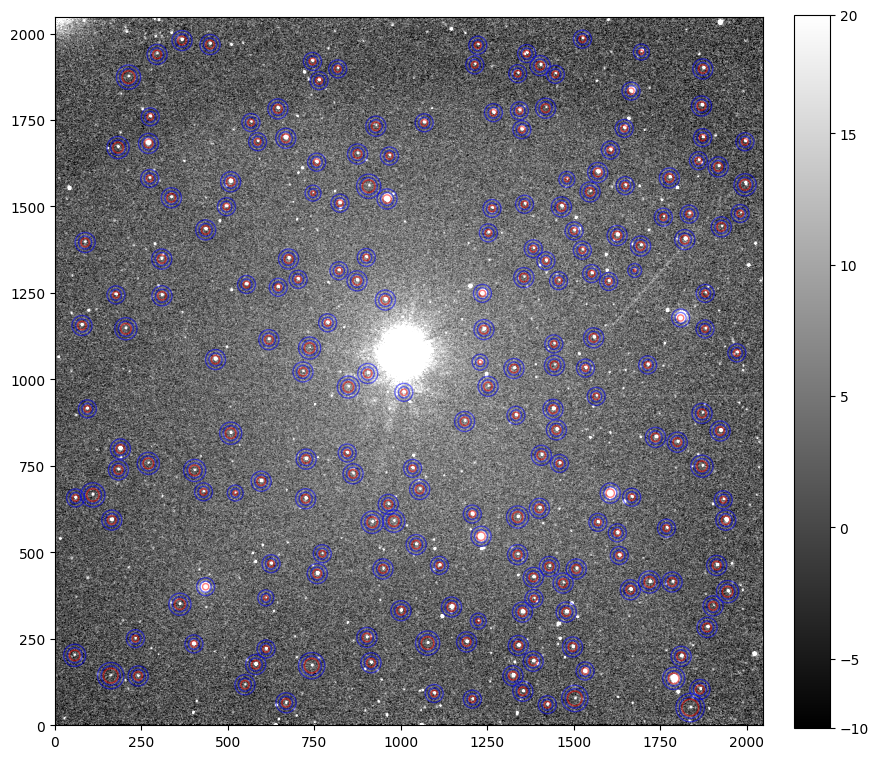

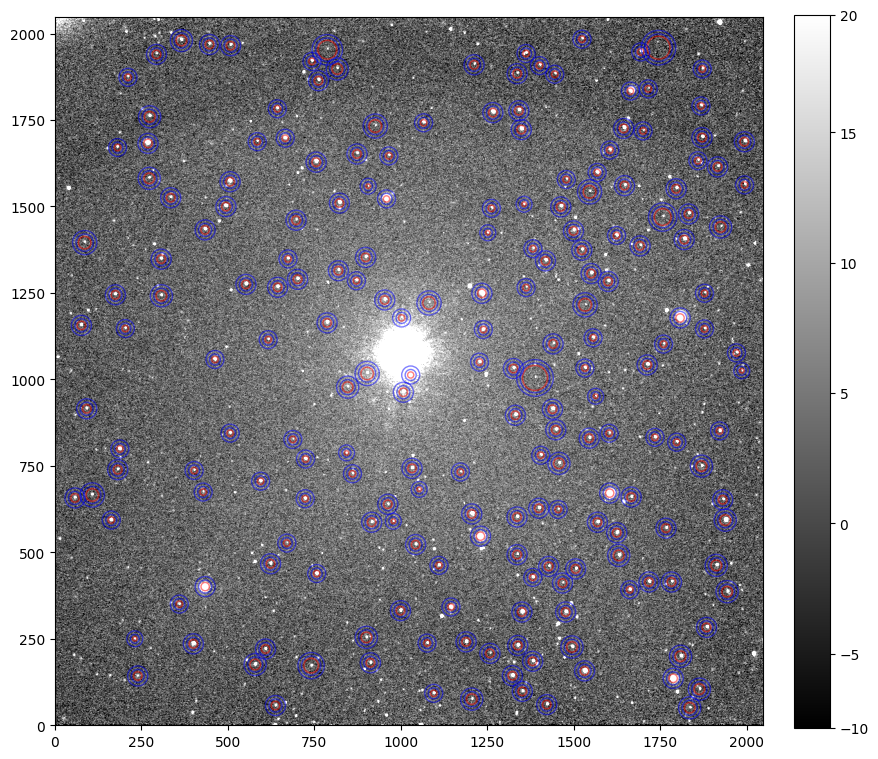

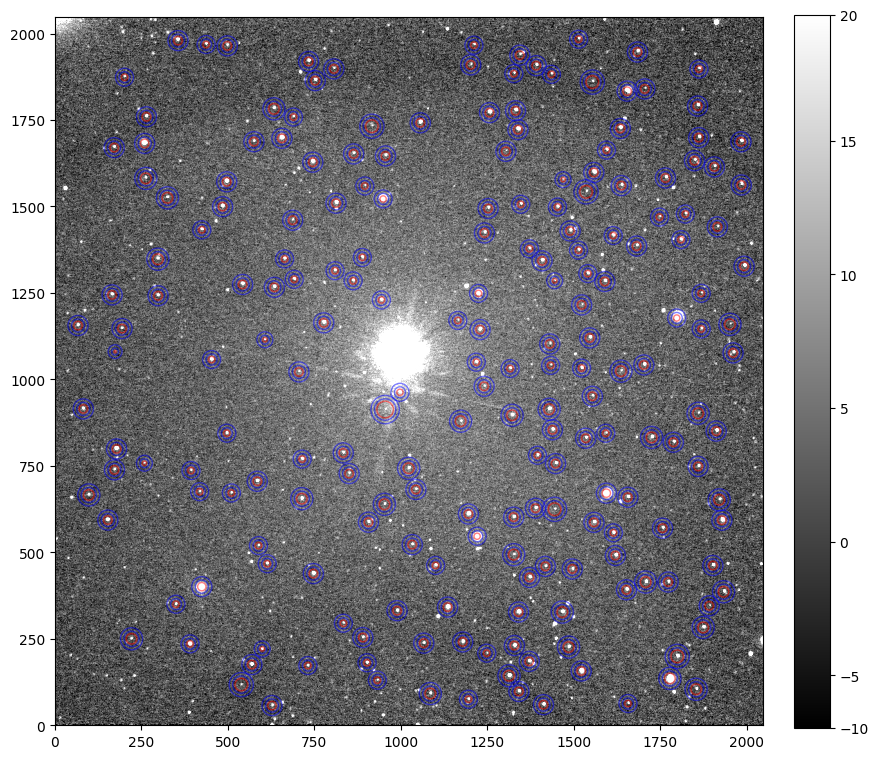

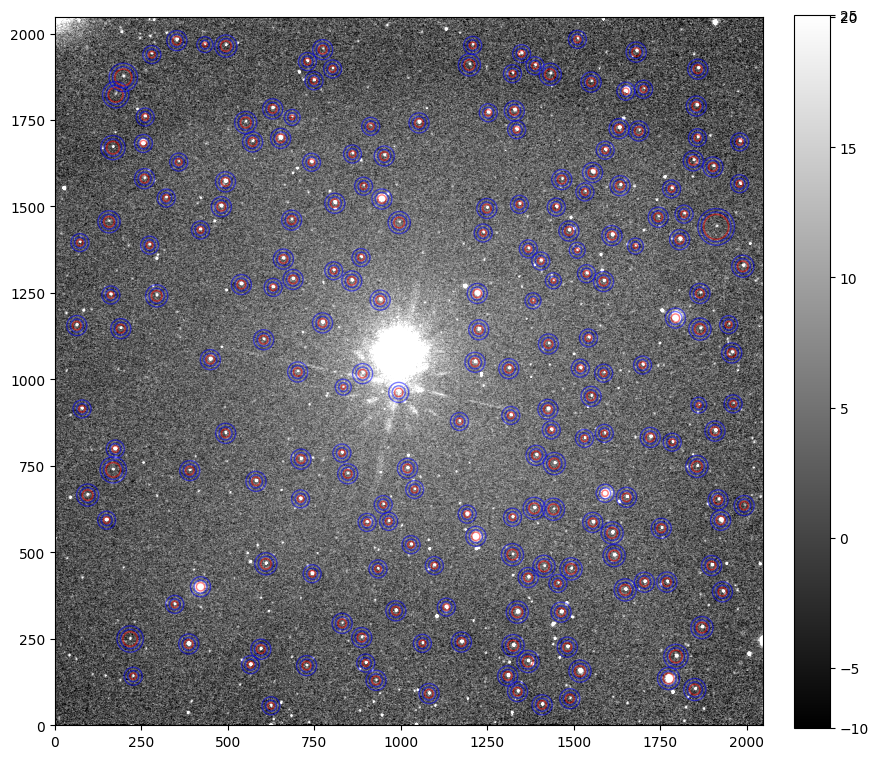

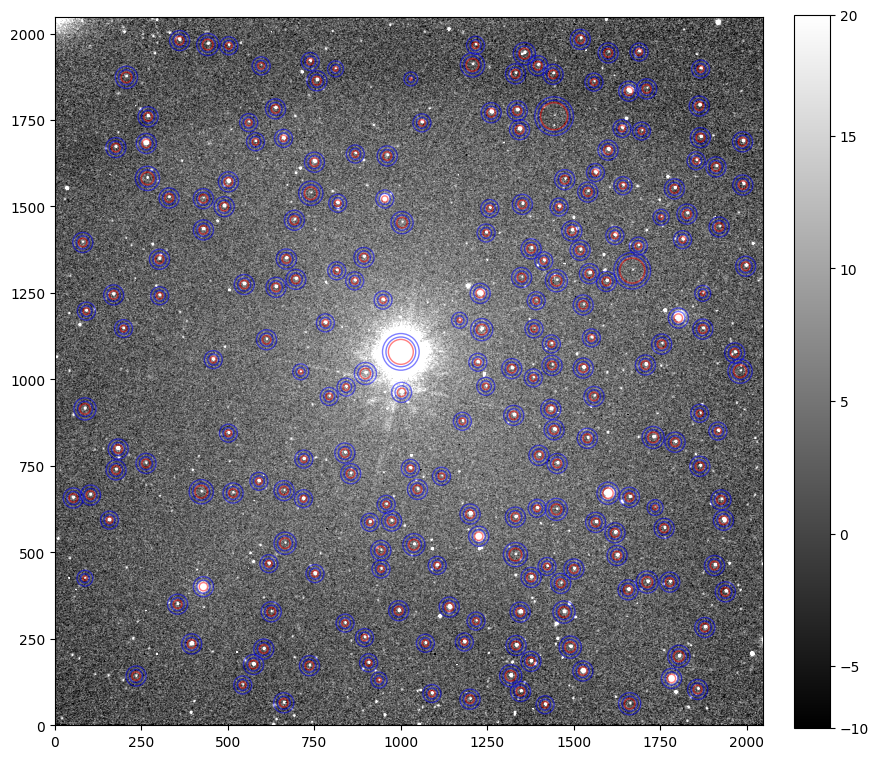

In [24]:
magnitude_list_faint = []
wanted_index2=np.linspace(0,len(image_list_long)-1,len(image_list_long))
#wanted_index2= [0]

for index,image in enumerate(image_list_long):
  if index in wanted_index2:
    mean, median, std = sigma_clipped_stats(image, sigma=3.0)
    #print((mean, median, std))
    daofind = DAOStarFinder(fwhm=5.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0) #roundlo and roundhi to adjust detection shape. need to be calibrated
    sources = daofind(image, mask=mask) #### or image-median? ???????????????????????????
    sources.sort(['xcentroid', 'ycentroid'])
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))

    # Exclude multiple detections and stars which are to close to edge or each other (keep the brightest star)
    positions,sources = filter_sources(positions, sources)

    #set high threshold to exclude bright star XXXXXXXXX take biggest fwhm is better (see below)
    #upper_threshold = 3 * std
    #faint_sources = sources[sources['flux'] < upper_threshold]
    #brightest_source_index = np.argmax(sources['flux'])
    #faint_sources = np.delete(sources, brightest_source_index)
    #positions_faint = np.transpose((faint_sources['xcentroid'], faint_sources['ycentroid']))

    #determine individual radii for apertures
    valid_positions, fwhm = determine_fwhm(image, positions)
    fwhm = [i+1 for i in fwhm] #### there must be a better solution
    #remove largest/brightest star
    for i in range (5): #pop the 5 largest apertures 
        fwhm_array = np.array(fwhm)
        largest_fwhm_index = np.argmax(fwhm_array)
        valid_positions.pop(largest_fwhm_index)
        fwhm.pop(largest_fwhm_index)

    radii = [value * 3 for value in fwhm]  # aperture size should be 3 * FWHM
    radii_in = [radius + 7 for radius in radii]
    radii_out = [radius + 17 for radius in radii]

    show_image(image)
    apertures_faint = [CircularAperture((x, y), r=r) for (x, y), r in zip(valid_positions, radii)]
    annulus_apertures_faint = [CircularAnnulus((x,y),r_in=r_in, r_out=r_out) for (x,y),r_in,r_out in zip(valid_positions,radii_in,radii_out)]
    for aperture in apertures_faint:
        aperture.plot(color="red", lw=1.0, alpha=0.5)
    for anulus in annulus_apertures_faint:
        anulus.plot(color="blue", lw=1.0, alpha=0.5)


    # Initialize an empty table to store the photometry results
    phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
    for i in range(len(apertures_faint)):
        aperstats = ApertureStats(image, annulus_apertures_faint[i])
        bkg = aperstats.median
        aperture_area = apertures_faint[i].area_overlap(image)
        total_bkg = bkg * aperture_area
        phot_table = aperture_photometry(image, apertures_faint[i])
        phot_table['total_bkg'] = total_bkg
        phot_table_faint.add_row([i, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])

    magnitudes=[]
    for row in phot_table_faint:
        magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime2))
        magnitudes.append(magnitude)
    magnitude_list_faint.append(magnitudes)
    #phot_table_faint['magnitude'] = magnitudes
    #phot_table_faint.pprint(max_lines=3, max_width=-1)


In [25]:
mean_faint_magnitudes_list = [np.mean(mag) for mag in magnitude_list_faint]
print(mean_faint_magnitudes_list)
print(np.std(mean_faint_magnitudes_list))

[-4.897065910276545, -4.93592905153898, -4.955129662090395, -4.922732833543229, -4.877401174165375]
0.027598393823957602


# Diff Phot


In [27]:
diff_magnitude_list = []

for index in kept_indices:
  diff_magnitude= magnitude_list_bright[index] - mean_faint_magnitudes_list [index]
  print(index,  magnitude_list_bright[index] , mean_faint_magnitudes_list [index], diff_magnitude)
  diff_magnitude_list.append(diff_magnitude)

print("")
print("The differential Magnitude of HIP100587 is: M = ", np.mean(diff_magnitude_list),"+-",np.std(diff_magnitude_list),"mag")

0 -15.126169852444404 -4.897065910276545 -10.229103942167859
1 -15.120002973322691 -4.93592905153898 -10.18407392178371
2 -15.135257020511405 -4.955129662090395 -10.18012735842101
3 -15.12663506355149 -4.922732833543229 -10.20390223000826
4 -15.133392475306525 -4.877401174165375 -10.255991301141151

The differential Magnitude of HIP100587 is: M =  -10.210639750704399 +- 0.02856512918803663 mag
